# Sep 11, 2025, Feb 5, 2026: diagnostics

conda env: gt

In [1]:
import os
import sys
import numpy as np
import pandas as pd
import dill as pickle 
from scipy import sparse, stats
from scipy.special import gammaln
import graph_tool.all as gt
from glob import glob
import re 
from tqdm import tqdm
from itertools import combinations
import math
from joblib import Parallel, delayed
# plotting
import matplotlib as mpl
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from cycler import cycler
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.cm import rainbow


# ignore user warnings
import warnings
warnings.filterwarnings("ignore") #, category=UserWarning)

In [2]:
def get_colorblind_palette(n=20):
    """Return a merged, deduplicated colorblind-safe palette from CUD, Seaborn, and extended sources."""
    base = [
        "#0072B2", "#D55E00", "#009E73", "#CC79A7",
        "#F0E442", "#56B4E9", "#E69F00", "#000000",
        "#999999", "#882255", "#44AA99", "#117733"
    ]
    
    new = [
        "#0173B2", "#DE8F05", "#029E73", "#D55E00",  # D55E00 already in base
        "#CC78BC", "#CA9161", "#FBAFE4", "#949494",
        "#ECE133", "#56B4E9"  # 56B4E9 already in base
    ]
    
    # Deduplicate while preserving order
    seen = set()
    full = base + new
    merged = []
    for color in full:
        if color.lower() not in seen:
            merged.append(color)
            seen.add(color.lower())
    
    return merged[:n]

def setup_mpl(fontsize=7):
    """Configure matplotlib for Illustrator export with Helvetica-style fonts and clean styles."""
    
    CUD_COLORS = get_colorblind_palette()
    
    mpl.rcParams.update({
        # Fonts and layout
        "font.family": "sans-serif",
        "font.sans-serif": ["Arial", "DejaVu Sans"],
        "font.size": fontsize,
        "axes.titlesize": fontsize,
        "axes.labelsize": fontsize,
        "xtick.labelsize": fontsize,
        "ytick.labelsize": fontsize,
        "legend.fontsize": fontsize,

        # Export settings
        "svg.fonttype": 'none',
        "pdf.fonttype": 42,
        "ps.fonttype": 42,
        "figure.dpi": 300,
        "savefig.dpi": 300,
        "text.usetex": False,

        # Axes and ticks
        "axes.linewidth": 0.5,
        "xtick.major.width": 0.5,
        "ytick.major.width": 0.5,
        "xtick.minor.width": 0.5,
        "ytick.minor.width": 0.5,
        "xtick.major.size": 2.5,
        "ytick.major.size": 2.5,

        # Lines
        "lines.linewidth": 1.0,

        # Default color cycle (Color Universal Design)
        "axes.prop_cycle": cycler('color', CUD_COLORS),
    })

    # mpl.rcParams["axes.prop_cycle"] = cycler('color', get_colorblind_palette())

def setup_plotting(palette=None, context="paper", fontsize=7):
    """
    Configure seaborn with 'paper' context and synced matplotlib rcParams.
    """
    setup_mpl(fontsize)

    if palette is None:
        try:
            from cycler import cycler
            cycle = mpl.rcParams['axes.prop_cycle']
            palette = [d['color'] for d in cycle]
        except Exception:
            palette = sns.color_palette("colorblind")

    sns.set_theme(
        context=context,       # use "paper"
        style="white", 
        palette=palette, 
        rc=mpl.rcParams
    )

    setup_mpl(fontsize)

In [3]:
# setup_plotting(context='paper', fontsize=7)
setup_mpl(fontsize=7)
CUD_COLORS = get_colorblind_palette()

In [4]:
def preview_colorblind_palette():
    colors = get_colorblind_palette()
    n = len(colors)
    
    fig, ax = plt.subplots(figsize=(5, 0.4 * n))
    for i, color in enumerate(colors):
        ax.plot([0, 1], [i, i], color=color, linewidth=6)
        ax.text(1.05, i, f"{i+1}: {color}", va='center', ha='left', fontsize=7)
    
    ax.set_ylim(-0.5, n - 0.5)
    ax.axis('off')
    plt.tight_layout()
    plt.show()

# Call the function
# preview_colorblind_palette()

| Color     | HEX       | Use |
|-----------|-----------|-----|
| Blue      | `#0072B2` | Chain 1 |
| Vermilion | `#D55E00` | Chain 2 |
| Green     | `#009E73` | Chain 3 |
| Purple    | `#CC79A7` | Chain 4 |
| Yellow    | `#F0E442` | Chain 5 |
| Light Blue| `#56B4E9` | Chain 6 |
| Orange    | `#E69F00` | Chain 7 |
| Black     | `#000000` | Chain 8 |

In [5]:
class ARGS():
    pass

args = ARGS()

args.SEED = 100

gt.seed_rng(args.SEED)
np.random.seed(args.SEED)

In [ ]:
args.ANALYSIS = 'trial-end'
# args.WINDOW = np.arange(5, 8+1)
args.GRAPH_DEF = f'constructed'
args.GRAPH_METHOD = f'pearson'
args.THRESHOLD = f'signed'
args.EDGE_DEF = f'binary'
args.EDGE_DENSITY = 20
args.LAYER_DEF = f'individual'
args.DATA_UNIT = f'sub'

BASE_path = f'/home/govindas/lab-data/aba'
PARC_DESC = f'NEWMAX_ROIs_final_gm_104_2mm' #f'ABA_ROIs_final_gm_36'
ROI_path = (
    f'{BASE_path}/{PARC_DESC}'
)
os.makedirs(ROI_path, exist_ok=True)
TS_path = f'{ROI_path}/roi-timeseries'
os.makedirs(TS_path, exist_ok=True)

ROI_RESULTS_path = (
    f'{ROI_path}'
    f'/analysis-{args.ANALYSIS}'
    f'/graph-{args.GRAPH_DEF}/method-{args.GRAPH_METHOD}'
    f'/threshold-{args.THRESHOLD}/edge-{args.EDGE_DEF}/density-{args.EDGE_DENSITY}'
    f'/layer-{args.LAYER_DEF}/unit-{args.DATA_UNIT}'
)
GRAPH_path = f'{ROI_RESULTS_path}/graphs'
SBM_path = f'{ROI_RESULTS_path}/model-fits'
DIAG_path = f'{ROI_RESULTS_path}/diagnostics_insets'
os.makedirs(DIAG_path, exist_ok=True)

In [7]:
args.dc, args.sbm = False, 'h'
args.force_niter = 3000 if args.sbm in ['o'] else 100000 #40000 
args.num_draws = int((1/2) * args.force_niter)

args.epsilon = 0.2 # threshold KSD for convergence
args.delta = np.ceil(args.force_niter / 75).astype(int)

def sbm_name(args):
    dc = f'dc' if args.dc else f'nd'
    dc = f'' if args.sbm in ['a', 'm'] else dc
    file = f'sbm-{dc}-{args.sbm}'
    return file

SBM = sbm_name(args)
SBM

'sbm-nd-h'

In [8]:
def collect_sbm_files(args, sbm_files):
    sbms_df = []
    for file in tqdm(sbm_files):    
        with open(file, 'rb') as f:
            [Bes, dls] = pickle.load(f)
            
        match = re.search(r'(sbm-[^/]+)/B-(\d+)/cond-([^_]+)_([^/]+)', file)
        if match:
            sbm, B, cond, name = match.groups()
            cond = '_'.join([cond, name])

        # Bes = Bes[0] if args.sbm in ['h'] else Bes

        row = pd.DataFrame(dict(
            sbm=[sbm],
            cond=[cond],
            chain=[B],
            Bes=[dls],
        ))
        sbms_df += [row]
    sbms_df = pd.concat(sbms_df).reset_index(drop=True)
    return sbms_df

In [9]:
sbm_files = sorted(glob(f'{SBM_path}/{SBM}/B-*/cond-*/desc-Bes-dls.pkl', recursive=True))
sbms_df = collect_sbm_files(args, sbm_files)
replacement_dict = {val: f'{i+1}' for i, val in enumerate(sbms_df['chain'].unique())}
sbms_df['chain'] = sbms_df['chain'].replace(replacement_dict)
len(sbms_df.iloc[9]['Bes']) + 1

100%|██████████| 20/20 [00:04<00:00,  4.52it/s]


100000

In [10]:
sbms_df.head(n=10)

,sbm,cond,chain,Bes
0,sbm-nd-h,PLAY_highR,1,"[1987.5003486500955, 1983.766508624519, 1979.5..."
1,sbm-nd-h,PLAY_highT,1,"[1858.6237152668612, 1850.6525809417683, 1856...."
2,sbm-nd-h,PLAY_lowR,1,"[1960.8007447363823, 1959.0283524054641, 1958...."
3,sbm-nd-h,PLAY_lowT,1,"[1973.2667842703513, 1978.532010216007, 1974.4..."
4,sbm-nd-h,PLAY_highR,2,"[1977.2609884443202, 1971.549025278748, 1970.9..."
5,sbm-nd-h,PLAY_highT,2,"[1858.9273072097014, 1856.383882634706, 1863.7..."
6,sbm-nd-h,PLAY_lowR,2,"[1931.8169528847131, 1931.3500215775791, 1930...."
7,sbm-nd-h,PLAY_lowT,2,"[1974.3284975208294, 1974.920794532619, 1982.3..."
8,sbm-nd-h,PLAY_highR,3,"[1977.7278182615717, 1980.345559670695, 1984.8..."
9,sbm-nd-h,PLAY_highT,3,"[1856.6610614288497, 1856.7102349157813, 1853...."


In [11]:
def KSD(args, chains_df):
    chain_idxs = chains_df.index.to_list()
    
    ksds_df = []
    for idx1, idx2 in (combinations(chain_idxs, 2)):
        Bes_ch1 = chains_df.iloc[idx1]['Bes']
        Bes_ch2 = chains_df.iloc[idx2]['Bes']
        Ds = []
        ts = np.arange(10, args.force_niter, args.delta)
        for t in ts:
            res = stats.ks_2samp(Bes_ch1[:t], Bes_ch2[:t])
            Ds.append(res.statistic)
        df = pd.DataFrame({
            'ch1': [idx1] * len(Ds),
            'ch2': [idx2] * len(Ds),
            't': ts,
            'D': Ds,
        })
        ksds_df.append(df)
    ksds_df = pd.concat(ksds_df).reset_index(drop=True)
    return ksds_df

def plot_KSD_inset(inset_ax, args, chains_df, ksds_df):
    """
    Plot KSD convergence curves into a given inset axis.
    Returns True if model is converged by midpoint criterion.
    """
    from itertools import combinations
    import numpy as np

    chain_idxs = chains_df.index.to_list()
    Ds = []

    for idx1, idx2 in combinations(chain_idxs, 2):
        t_D = ksds_df[
            (ksds_df['ch1'] == idx1) &
            (ksds_df['ch2'] == idx2)
        ][['t', 'D']].to_numpy()

        Ds.append(t_D[:, 1])
        inset_ax.plot(
            t_D[:, 0],
            t_D[:, 1],
            color=CUD_COLORS[0],
            alpha=0.5,
            linewidth=0.75,
        )

    Ds = np.stack(Ds, axis=-1)
    T = Ds.shape[0]
    converged = np.all(Ds[T//2:, :] < args.epsilon)
    
    t = t_D[:, 0]
    inset_ax.plot(t, np.median(Ds, axis=-1), color=CUD_COLORS[1], linewidth=1.0)
    inset_ax.plot(t, args.epsilon * np.ones_like(t), color="#999999", linestyle="--", linewidth=0.8)
    inset_ax.axvline(x=args.num_draws, color="#CA9161", linestyle="--", linewidth=0.8)

    # Style
    # title = '' if converged else 'ill-suited'
    # inset_ax.set_title(f'{title}', fontsize=6)
    inset_ax.set_ylabel("KSD", fontsize=6, labelpad=-6)
    inset_ax.set_xlabel("MCMC steps", fontsize=6, labelpad=-6)
    xmin, xmax = inset_ax.get_xlim()
    xticks = np.linspace(xmin, xmax, 5)
    inset_ax.set_xticks([np.ceil(xt) for xt in xticks], labels=['0', '', '', '', '10'])
    inset_ax.set_yticks([0, 0.5, 1], [0, '', 1])
    inset_ax.tick_params(labelsize=6, width=0.5, length=2)
    for spine in inset_ax.spines.values():
        spine.set_linewidth(0.5)
    inset_ax.grid(alpha=0.3)
    
    return converged, np.mean(Ds, axis=-1)

In [12]:
def plot_density_overlap(ax, args, chains_df, label='None', legend=False):
    df = chains_df.explode('Bes_conv')
    
    sns.kdeplot(
        data=df, ax=ax,
        x='Bes_conv',
        hue='chain',
        palette=CUD_COLORS,
        fill=True,
        alpha=0.1,
        legend=False,
    )

    ax.set_title(f'{label}', fontsize=7, pad=2)
    ax.set_xlabel('description length', fontsize=7,)# labelpad=2)
    ax.set_ylabel('density', fontsize=7)
    ax.set_yticklabels([])  # clean y-axis for panel plots
    ax.tick_params(axis='y', which='major', length=2.5, width=0.5)
    ax.grid(alpha=0.15, linewidth=0.3)

    # Rounded xticks
    xmin, xmax = ax.get_xlim()
    xticks = np.linspace(xmin, xmax, 5)
    ax.set_xticks(np.round(xticks, 1))
    ax.tick_params(axis='x', which='major', length=2.5, width=0.5)

    return None

In [13]:
def _prep_group(args, sub, group):
    group = group.reset_index(drop=True)
    group['Bes_conv'] = group['Bes'].apply(lambda x: x[-args.num_draws:])
    ksds_df = KSD(args, group)
    return sub, group, ksds_df

In [14]:
groups = [ (s, g) for s, g in sbms_df.groupby(by=['cond']) ]
results = Parallel(n_jobs=5, backend='loky')(
    delayed(_prep_group)(args, cond[0], group)
    for cond, group in groups
)
# results keeps original groupby order

In [15]:
s, g = groups[3]

In [16]:
def create_diagnostics_plots(args, results, sbms_df):
    ncols = 5
    subs = list(sbms_df['cond'].unique())
    nsubs = len(subs)
    nrows = math.ceil(nsubs / ncols)

    a = 20 / 9
    b = a * 4 / 7
    
    fig, axs = plt.subplots(
        nrows=nrows, ncols=ncols,
        figsize=(a*ncols, b*nrows),
        sharex=False, sharey=False
    )
    axs = np.atleast_2d(axs)
    fig.tight_layout(h_pad=2.5, w_pad=0)
    
    mean_ksds = []
    for idx, (sub, group, ksds_df) in enumerate(results):
        r, c = divmod(idx, ncols)
        ax = axs[r, c]
        
        legend = False
        plot_density_overlap(ax, args, group, label=f'cond-{sub}', legend=legend)
        iax = inset_axes(ax, width='45%', height='45%', loc='upper right', borderpad=0.5)
        converged, mean_ksd = plot_KSD_inset(iax, args, group, ksds_df)
        mean_ksds.append(mean_ksd)
        
    for k in range(len(results), nrows*ncols):
        r, c = divmod(k, ncols)
        axs[r, c].axis('off')
    
    ref_pos = axs[0, 0].get_position() if nsubs > 0 else None
    return fig, np.stack(mean_ksds, axis=0), ref_pos

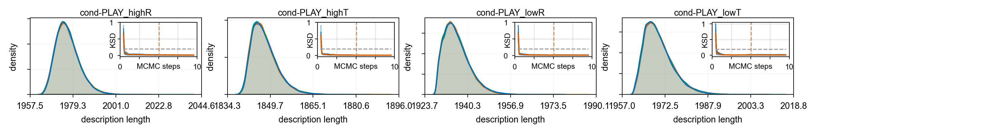

In [17]:
# figfile = f'{DIAG_path}/{SBM}_desc-diagnostics.png'
# if os.path.exists(figfile):
#     display(Image(figfile))
# else:
fig, mean_ksds, ref_pos = create_diagnostics_plots(args, results, sbms_df)

In [18]:
fig.savefig(f'{DIAG_path}/{SBM}_desc-KSD-dist.png', bbox_inches='tight', transparent=True)
fig.savefig(f'{DIAG_path}/{SBM}_desc-KSD-dist.svg', bbox_inches='tight', transparent=True)